In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
import scipy.stats as st
import matplotlib.ticker as mticker
import plotly.express as px

In [4]:
data = pd.read_csv("p2-arbres-fr.csv", sep=";")

In [5]:
data.loc[data["remarquable"].isnull(), "remarquable"] = 0.0
data.loc[data["genre"].isnull(),"genre"] = "Autre"
data.loc[data["domanialite"].isnull(), "domanialite"] = "Autre"
data.loc[data["stade_developpement"].isnull(), "stade_developpement"] = "Autre"
data.loc[data["stade_developpement"].isnull(), "stade_developpement"] = "Autre"


In [7]:
data.loc[data["hauteur_m"]==0,"hauteur_m"] = 1
data.loc[data["circonference_cm"]==0,"circonference_cm"] = 1

In [8]:
data.loc[data["circonference_cm"]>700, "circonference_cm"] = 700
data.loc[data["hauteur_m"]>31, "hauteur_m"] = 31

In [9]:
data.loc[data["arrondissement"].str.contains('ARRDT'),"arrond"] = data.loc[data["arrondissement"].str.contains('ARRDT'),"arrondissement"].str.split(' ').str[1].str[:-1]
data.loc[data["arrondissement"]=='VAL-DE-MARNE',"arrond"] = 94
data.loc[data["arrondissement"]=='SEINE-SAINT-DENIS',"arrond"] = 93
data.loc[data["arrondissement"]=='HAUTS-DE-SEINE',"arrond"] = 92
data.loc[data["arrondissement"]=='BOIS DE VINCENNES',"arrond"] = 94
data.loc[data["arrondissement"]=='BOIS DE BOULOGNE',"arrond"] = 92
data.loc[data["arrond"]=='1E',"arrond"] = 1
data.arrond = data.arrond.astype(int)

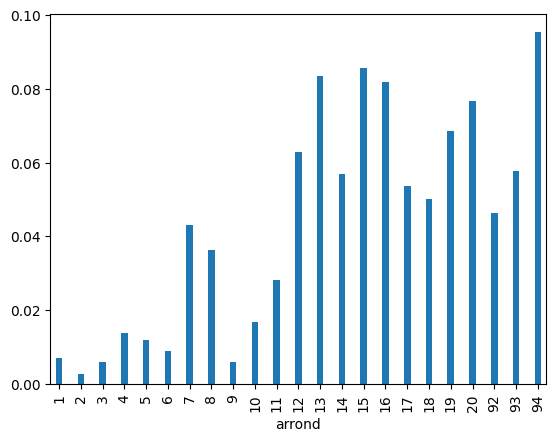

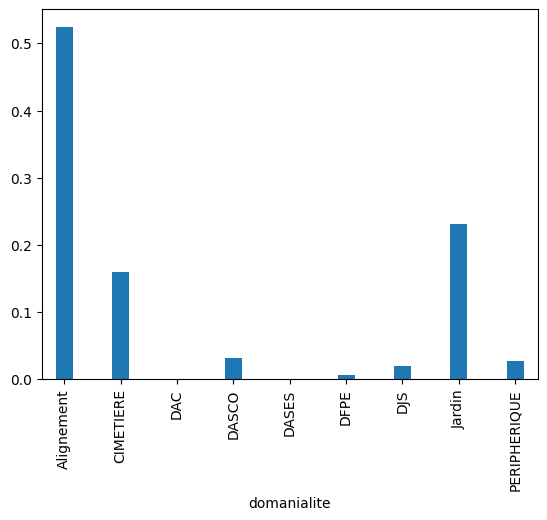

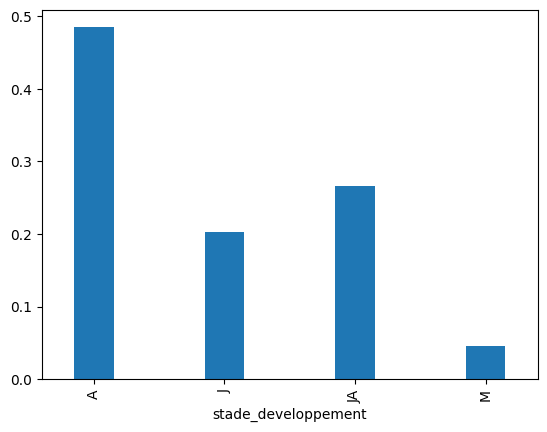

In [16]:
list_categ_histo = ["arrond", "domanialite", "stade_developpement"]
for categ in list_categ_histo:
    data.loc[data[categ]!="Autre",categ].value_counts(normalize=True).sort_index().plot(kind='bar', width=0.3)
    plt.xlabel(categ)
    plt.show()

1497


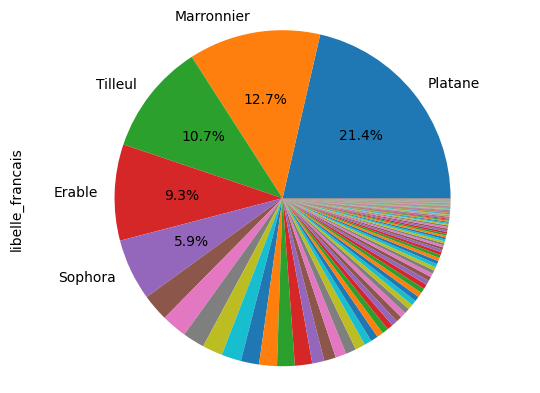

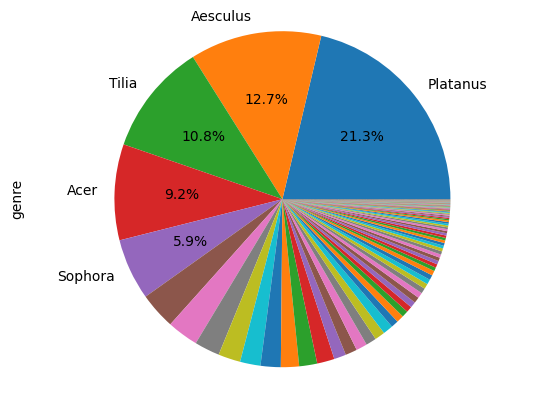

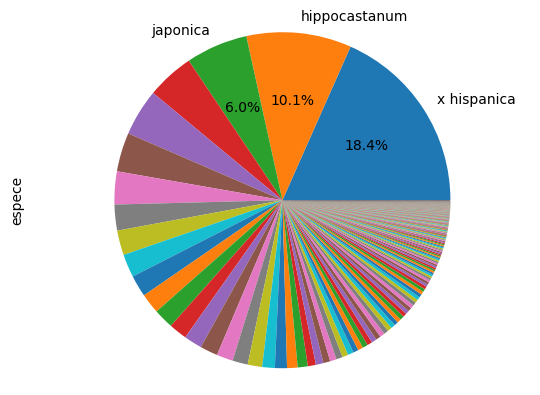

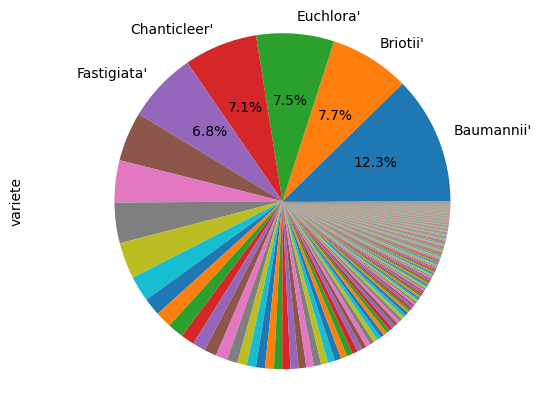

In [34]:
list_categ_pie = ["libelle_francais", "genre", "espece", "variete"]
temp_nb = len(data.loc[data["libelle_francais"].isnull(),:])
print(temp_nb)
# pour afficher les pourcentages et les libellés pour les parts > 5%
limit_perc = 5
def show_perc(pct):
    return ('%.1f%%' % pct) if pct > limit_perc else ''

def show_labels(data):
    list = []
    for val, cnt in data.items():
        if (cnt*100/np.sum(data)) > limit_perc :
            list.append(val)
        else:
            list.append('')
    return list

# représentation graphique
for categ in list_categ_pie:
    temp_val_count = data[categ].value_counts(normalize=True)
    temp_val_count.plot(kind='pie', autopct=show_perc, labels=show_labels(temp_val_count))
    plt.axis('equal')
    plt.show()

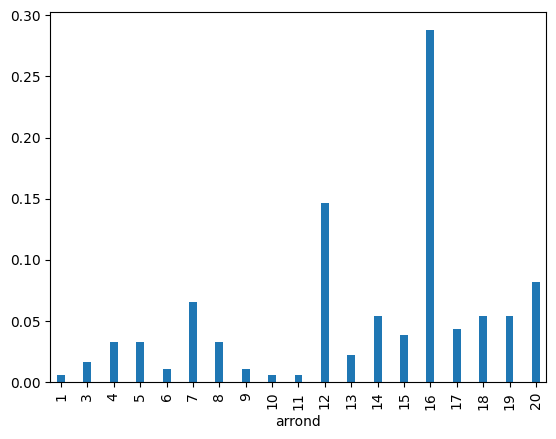

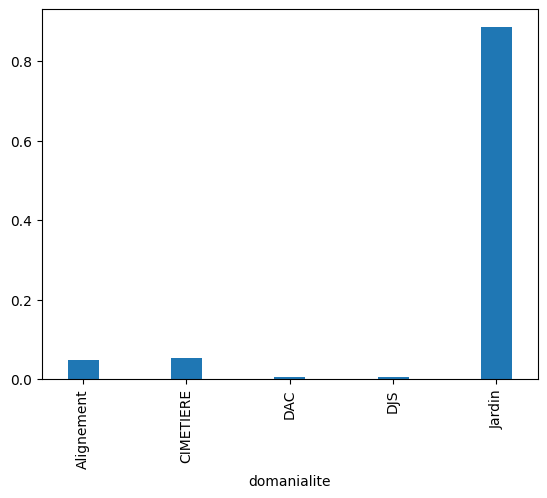

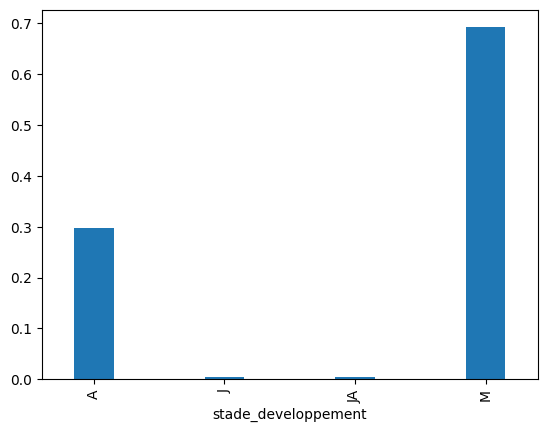

In [20]:
list_categ_histo = ["arrond", "domanialite", "stade_developpement"]
for categ in list_categ_histo:
    data.loc[(data[categ]!="Autre") & (data["remarquable"]==1),categ].value_counts(normalize=True).sort_index().plot(kind='bar', width=0.3)
    plt.xlabel(categ)
    plt.show()

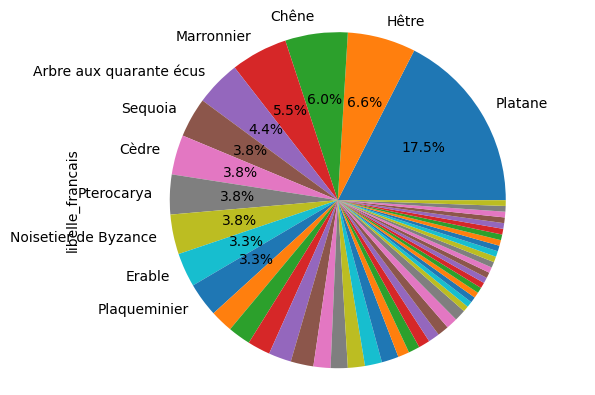

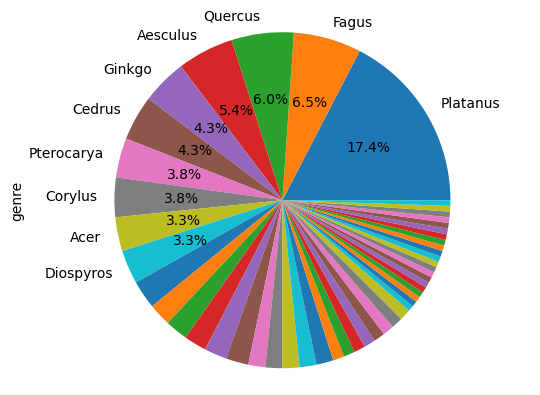

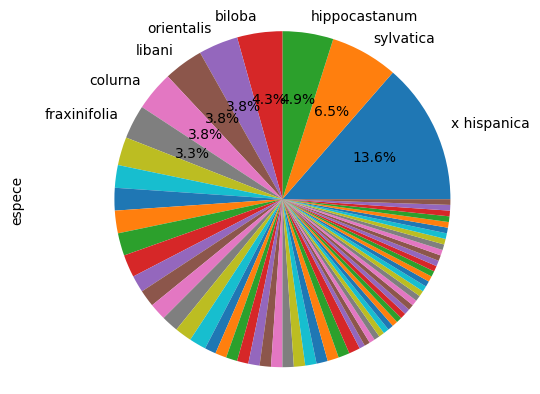

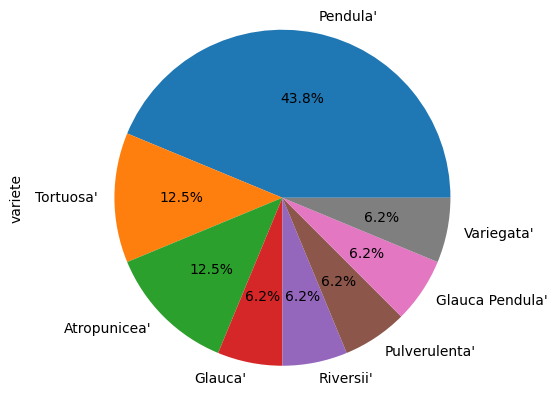

In [23]:
list_categ_pie = ["libelle_francais", "genre", "espece", "variete"]

# pour afficher les pourcentages et les libellés pour les parts > 5%
limit_perc = 3
def show_perc(pct):
    return ('%.1f%%' % pct) if pct > limit_perc else ''

def show_labels(data):
    list = []
    for val, cnt in data.items():
        if (cnt*100/np.sum(data)) > limit_perc :
            list.append(val)
        else:
            list.append('')
    return list

# représentation graphique
for categ in list_categ_pie:
    temp_val_count = data.loc[data["remarquable"]==1,categ].value_counts(normalize=True)
    temp_val_count.plot(kind='pie', autopct=show_perc, labels=show_labels(temp_val_count))
    plt.axis('equal')
    plt.show()

In [24]:
data["stade_developpement"].unique()

array(['Autre', 'A', 'J', 'M', 'JA'], dtype=object)

In [44]:
arbres_remarquables = data.loc[data["remarquable"]==1,:]
nb_12_16_7_20 = arbres_remarquables.loc[
    (arbres_remarquables["arrond"]==12) | (arbres_remarquables["arrond"]==16) |
    (arbres_remarquables["arrond"]==7) | (arbres_remarquables["arrond"]==20),:]

truc = data.loc[(data["arrond"]==12) | (data["arrond"]==16),:]
bidule = data.loc[(data["arrondissement"]=="BOIS DE VINCENNES") | (data["arrondissement"]=="BOIS DE BOULOGNE"),:]
chouette = data.loc[(data["arrondissement"]=="VAL-DE-MARNE") | (data["arrondissement"]=="HAUTS-DE-SEINE"),:]
chose = arbres_remarquables.loc[arbres_remarquables["arrond"]==20,:]

fig = px.density_mapbox(truc,
lat='geo_point_2d_a', lon='geo_point_2d_b',
hover_data=['domanialite', 'lieu'],
radius=2,
zoom=10.6,
mapbox_style="open-street-map",
title="Localisation des" + str(len(truc)) + "arbres dans les arrondissements du 12 et du 16e.",
width=1000,
height=800,
)
fig.show()

fig = px.density_mapbox(bidule,
lat='geo_point_2d_a', lon='geo_point_2d_b',
hover_data=['domanialite', 'lieu'],
radius=2,
zoom=10.6,
mapbox_style="open-street-map",
title="Localisation des" + str(len(bidule)) + "arbres dans les bois.",
width=1000,
height=800,
)
fig.show()

fig = px.density_mapbox(chouette,
lat='geo_point_2d_a', lon='geo_point_2d_b',
hover_data=['domanialite', 'lieu'],
radius=2,
zoom=10.6,
mapbox_style="open-street-map",
title="Localisation des" + str(len(chouette)) + "arbres dans les bois.",
width=1000,
height=800,
)
fig.show()


fig = px.density_mapbox(chose,
lat='geo_point_2d_a', lon='geo_point_2d_b',
hover_data=['domanialite', 'lieu'],
radius=2,
zoom=10.6,
mapbox_style="open-street-map",
title="Localisation des" + str(len(chose)) + "arbres dans le 7e.",
width=1000,
height=800,
)
fig.show()